## L3c: Understanding the Role of Income and Prices on Optimal Decisions

Consider a utility maximization problem with the Cobb-Douglas utility function, $U(x_{1},x_{2}) = x_{1}^{\alpha}x_{2}^{1-\alpha}$, subject to a budget constraint. 
The Lagrangian for this system is given by:

$$
\begin{equation*}
\mathcal{L}(x,\lambda) = x_{1}^{\alpha}x_{2}^{1-\alpha} + \lambda\cdot\left(I-c_{1}x_{1}-c_{2}x_{2}\right)
\end{equation*}
$$

which gives the first-order optimality conditions:

$$
\begin{eqnarray*}
\frac{\partial\mathcal{L}}{\partial{x_{1}}} & = & \alpha\cdot{x_{1}^{\alpha-1}}x_{2}^{1-\alpha} - \lambda\cdot{c_{1}} = 0 \\
\frac{\partial\mathcal{L}}{\partial{x_{2}}} & = & (1-\alpha)\cdot{x_{1}^{\alpha}x_{2}^{-\alpha}} - \lambda\cdot{c_{2}} = 0 \\
\frac{\partial\mathcal{L}}{\partial\lambda} & = & I - c_{1}x_{1} - c_{2}x_{2} = 0
\end{eqnarray*}
$$

This system of first-order optimality conditions can be solved for the optimal consumption levels of $x_{1}$ and $x_{2}$. However, it is non-linear. Thus, we often need to use numerical methods to find the optimal values of $x_{1}$ and $x_{2}$.

### Learning objectives
In this lab, we'll use a numerical approach to solve for the optimal allocation between `apples` and `oranges` for a `Cobb-Douglas` utility function for various problem conditions.

* `Base`: First, we'll start by computing the optimal solution for a `base` set of parameters, `I = 20 USD` budget, `P&C` fruit prices, and $\alpha = [0.55,0.45]$.  
* `Case I`: Next, we'll change the budget $I\leftarrow{\theta}\times{I}$, where $\theta\geq{0}$ and compare the perturbed solution to the `base` solution.
* `Case II`: Then, we'll change the price of `apples` to $c_{1}\leftarrow\vartheta{c_{1}}$, where $\vartheta\geq{0}$ and compare the perturbed solution to the `base` solution.and compare the perturbed solution to the `base` solution.
* `Case III`: Finally, we'll change the exponent vector $\alpha$, i.e., we'll adjust how we value `apples` versus `oranges` compared to the `base` solution.In this lab, we'll use a numerical approach to solve for the optimal allocation between `apples` and `oranges` for a `Cobb-Douglas` utility function for various problem conditions.

### Setup
The computations in this lab (or example) are enabled by the [VLDecisionsPackage.jl](https://github.com/varnerlab/VLDecisionsPackage.jl.git) and several external `Julia` packages. To load the required packages and any custom codes the teaching team has developed to work with these packages, we [include](https://docs.julialang.org/en/v1/manual/code-loading/) the `Include.jl` file):

In [1]:
include("Include.jl");

  Activating project at `~/Desktop/julia_work/CHEME-5760-Labs-F23`
    Updating registry at `~/.julia/registries/General.toml`
    Updating git-repo `https://github.com/varnerlab/VLDecisionsPackage.jl.git`
   Installed ConstructionBase ─── v1.5.4
   Installed StringManipulation ─ v0.3.2
   Installed StaticArrays ─────── v1.6.3
    Updating `~/Desktop/julia_work/CHEME-5760-Labs-F23/Project.toml`
  [10f378ab] ~ VLDecisionsPackage v0.1.0 `https://github.com/varnerlab/VLDecisionsPackage.jl.git#main` ⇒ v0.1.0 `https://github.com/varnerlab/VLDecisionsPackage.jl.git#main`
    Updating `~/Desktop/julia_work/CHEME-5760-Labs-F23/Manifest.toml`
  [187b0558] ↑ ConstructionBase v1.5.3 ⇒ v1.5.4
  [90137ffa] ↑ StaticArrays v1.6.2 ⇒ v1.6.3
  [892a3eda] ↑ StringManipulation v0.3.1 ⇒ v0.3.2
  [10f378ab] ~ VLDecisionsPackage v0.1.0 `https://github.com/varnerlab/VLDecisionsPackage.jl.git#main` ⇒ v0.1.0 `https://github.com/varnerlab/VLDecisionsPackage.jl.git#main`
Precompiling project...
  ✓ ConstructionBa

### `Base`: Let's recompute the lecture example
Use a `Cobb-Douglas` utility function, in combination with a budget constraint, to compute the optimal combination of of `apples` and `oranges`. 

#### Strategy
* Use the `build(...)` to construct an instance of the `MySimpleCobbDouglasChoiceProblem` type holding the lecture parameters, set this to the `base_problem` variable.
* Pass the `base_problem` problem to the `solve(...)` function, set the return to the variable `base_solution`.

In [2]:
# initialize -
α = [0.55, 0.45]; # coefficients
c = [0.98, 1.49]; # price of x1 and x2
total_budget = 20.0;

# build my problem object -
base = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c, # price of x1 and x2
    I = total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

# call the solve function. This will return a dictionary -
base_solution = solve(base);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.71e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4721739e-01 7.77e-16 3.35e-01  -1.0 3.61e-01    -  6.57e-01 1.00e+00h  

In [3]:
base_solution

Dict{String, Any} with 3 entries:
  "argmax"          => [11.2245, 6.04027]
  "budget"          => 20.0
  "objective_value" => 8.49311

### Case I: What happens if we spend more (or less) money?
Suppose we adjust the budget that we are allocating to fruit purchases. Now we are able to spend $I\leftarrow{\theta}\times{I}$ on fruit, where $\theta\geq{0}$. How does this change the `base` allocation?

In [4]:
θ = 2.0;

Build a problem object with the new budget value, set this to the `problem₁` variable, and then compute the optimal allocation between `apples` and `oranges` with the new budget value using the `solve(...)` method, set the return to the `solution₁` variable:

In [5]:
# build my problem object -
problem₁ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c, # price of x1 and x2
    I = θ*total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

# call the solve function. This will return a dictionary -
solution₁ = solve(problem₁);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.71e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4863747e-01 9.99e-16 3.44e-01  -1.0 3.65e-01    -  6.52e-01 1.00e+00h  

In [ ]:
# # build my problem object -
# problem₁ = build(MySimpleCobbDouglasChoiceProblem, (
    
#     initial = 0.1*ones(2), # initial guess
#     α = α, # coefficients
#     c = c, # price of x1 and x2
#     I = θ*total_budget, # income
    
#     # how much of x₁ and x₂ can be we buy?
#     bounds = [
#         0.0 100.0; # L U
#         0.0 100.0; # L U
#     ]
# ));

# # call the solve function. This will return a dictionary -
# solution₁ = solve(problem₁);

In [ ]:
let problem = problem₁, solution = solution₁
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    c = problem.c;
    budget_value = problem.I;
    xlim = [0.0, 1.1*(budget_value/c[1])];
    ylim = [0.0, 1.1*(budget_value/c[2])];
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)

    # compute the budget -
    BC = budget(problem, xlim)

    # make the plots -
    plot(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

#### Visualize: `Apples` versus `Oranges` for $I\leftarrow{\theta}\times{I}$ USD

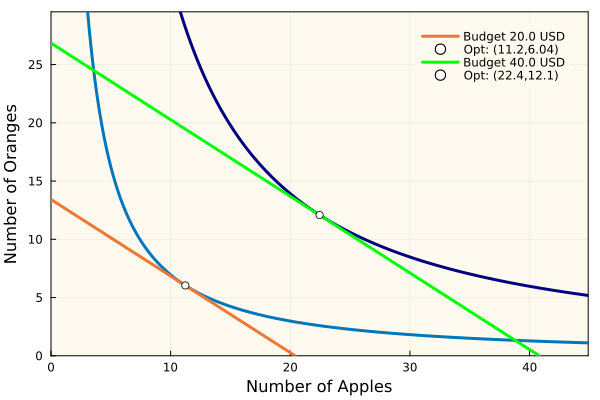

In [6]:
let args = (problem = problem₁, solution = solution₁, 
        base_problem=base, base_solution = base_solution)
    
    # get stuff from the arg tuple -
    problem = args.problem;
    solution = args.solution;
    base_problem = args.base_problem;
    base_solution = args.base_solution
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    Uopt_base = round(base_solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    xopt_base = base_solution["argmax"];
    c = problem.c;
    c_base = base_problem.c;
    budget_value = problem.I;
    budget_value_base = base_problem.I;
    
    xlim_problem = [0.0, 1.1*(budget_value/c[1])];
    ylim_problem = [0.0, 1.1*(budget_value/c[2])];
    xlim_base = [0.0, 1.1*(budget_value_base/c_base[1])];
    ylim_base = [0.0, 1.1*(budget_value_base/c_base[2])];
    xlim = [0.0, max(xlim_problem[2], xlim_base[2])];
    ylim = [0.0, max(ylim_problem[2], ylim_base[2])];
    
    
    # xlim = [0.0, 1.1*(budget_value/c[1])];
    # ylim = [0.0, 1.1*(budget_value/c[2])];
    
    
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)
    x1_opt_base = round(xopt_base[1]; sigdigits=3)
    x2_opt_base = round(xopt_base[2]; sigdigits=3)
    

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)
    base_INC = indifference(base_problem, Uopt_base, xlim)

    # compute the budget -
    BC = budget(problem, xlim);
    base_BC = budget(base_problem, xlim);

    
    # make the base plots -
    plot(base_INC[:,1],base_INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(base_BC[:,1],base_BC[:,2], label="Budget $(budget_value_base) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt_base[1]], [xopt_base[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt_base),$(x2_opt_base))")
    
    # make the problem plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=:navyblue,
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=:green1, xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

### Case II: What happens if the price of an `Apple` changes?
Suppose a tree disease impacts the supply of apples; alternatively, scientists create the `impossible apple`, which everyone enjoys more than actual apples. Let the new unit price of an `apple` be $c_{1}\leftarrow\vartheta\times{c}_{1}$:

In [11]:
ϑ = 0.5;

Build a problem object, and compute the optimal allocation between `apples` and `oranges` with the new `apple` price:

In [12]:
c₂ = [ϑ*(0.98), 1.49]; # price of x1 and x2
problem₂ = build(MySimpleCobbDouglasChoiceProblem, (
    
    initial = 0.1*ones(2), # initial guess
    α = α, # coefficients
    c = c₂, # price of x1 and x2
    I = 1.0*total_budget, # income
    
    # how much of x₁ and x₂ can be we buy?
    bounds = [
        0.0 100.0; # L U
        0.0 100.0; # L U
    ]
));

solution₂ = solve(problem₂);

This is MadNLP version v0.7.0, running with umfpack

Number of nonzeros in constraint Jacobian............:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        2
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0 -1.0000000e-01 0.00e+00 4.39e-01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1 -2.4817670e-01 6.66e-16 3.41e-01  -1.0 2.89e-01    -  6.52e-01 1.00e+00h  

In [ ]:
# c₂ = [ϑ*(0.98), 1.49]; # price of x1 and x2
# problem₂ = build(MySimpleCobbDouglasChoiceProblem, (
    
#     initial = 0.1*ones(2), # initial guess
#     α = α, # coefficients
#     c = c₂, # price of x1 and x2
#     I = 1.0*total_budget, # income
    
#     # how much of x₁ and x₂ can be we buy?
#     bounds = [
#         0.0 100.0; # L U
#         0.0 100.0; # L U
#     ]
# ));

# solution₂ = solve(problem₂);

#### Visualize: `Apples` versus `Oranges` for `I = 20 USD` and $c_{1} \leftarrow \vartheta\times{c}_{1}$

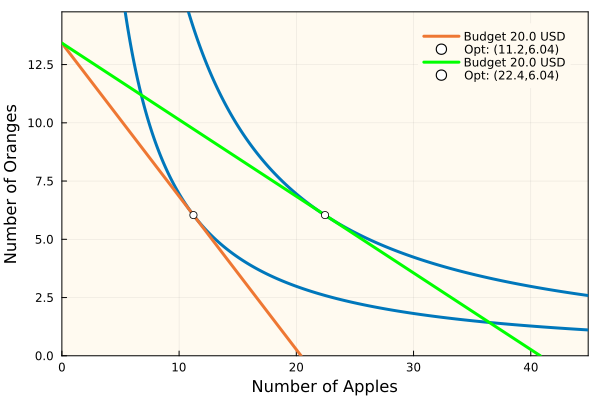

In [13]:
let args = (problem = problem₂, solution = solution₂, 
        base_problem=base, base_solution = base_solution)
    
    # get stuff from the arg tuple -
    problem = args.problem;
    solution = args.solution;
    base_problem = args.base_problem;
    base_solution = args.base_solution
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    Uopt_base = round(base_solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    xopt_base = base_solution["argmax"];
    c = problem.c;
    c_base = base_problem.c;
    budget_value = problem.I;
    budget_value_base = base_problem.I;
    
    xlim_problem = [0.0, 1.1*(budget_value/c[1])];
    ylim_problem = [0.0, 1.1*(budget_value/c[2])];
    xlim_base = [0.0, 1.1*(budget_value_base/c_base[1])];
    ylim_base = [0.0, 1.1*(budget_value_base/c_base[2])];
    xlim = [0.0, max(xlim_problem[2], xlim_base[2])];
    ylim = [0.0, max(ylim_problem[2], ylim_base[2])];
    
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)
    x1_opt_base = round(xopt_base[1]; sigdigits=3)
    x2_opt_base = round(xopt_base[2]; sigdigits=3)
    

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim)
    base_INC = indifference(base_problem, Uopt_base, xlim)

    # compute the budget -
    BC = budget(problem, xlim);
    base_BC = budget(base_problem, xlim);

    
    # make the base plots -
    plot(base_INC[:,1],base_INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(base_BC[:,1],base_BC[:,2], label="Budget $(budget_value_base) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt_base[1]], [xopt_base[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt_base),$(x2_opt_base))")
    
    # make the problem plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=:green1, xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end

### Case III: What happens if my preferences change?
Preferences can be ephemeral. In the Cobb-Douglas utility model, we'll use the exponent vector as a dial to adjust our preferences. Let's build a new $\alpha$ vector and recompute the `apples` versus `oranges` decision. 

Specify the `apple` exponent:

In [ ]:
apple_exponent = 0.60;

Build a problem object, and compute the optimal allocation between `apples` and `oranges` with the new $\alpha$-vector:

In [ ]:
α₃ = [apple_exponent, 1 - apple_exponent];

In [ ]:
# Fill me in

In [ ]:
# problem₃ = build(MySimpleCobbDouglasChoiceProblem, (
    
#     initial = 0.1*ones(2), # initial guess
#     α = α₃, # coefficients
#     c = c, # price of x1 and x2
#     I = 1.0*total_budget, # income
    
#     # how much of x₁ and x₂ can be we buy?
#     bounds = [
#         0.0 100.0; # L U
#         0.0 100.0; # L U
#     ]
# ));

# solution₃ = solve(problem₃);

#### Visualize: `Apples` versus `Oranges` for `I = 20 USD` and a new $\alpha$ vector

In [ ]:
let args = (problem = problem₃, solution = solution₃, 
        base_problem=base, base_solution = base_solution)
    
    # get stuff from the arg tuple -
    problem = args.problem;
    solution = args.solution;
    base_problem = args.base_problem;
    base_solution = args.base_solution
    
    # ok, let's grab the results dictionary, and the Uopt -
    Uopt = round(solution["objective_value"], sigdigits=4);
    Uopt_base = round(base_solution["objective_value"], sigdigits=4);
    xopt = solution["argmax"];
    xopt_base = base_solution["argmax"];
    c = problem.c;
    c_base = base_problem.c;
    budget_value = problem.I;
    budget_value_base = base_problem.I;
    
    xlim_problem = [0.0, 1.1*(budget_value/c[1])];
    ylim_problem = [0.0, 1.1*(budget_value/c[2])];
    xlim_base = [0.0, 1.1*(budget_value_base/c_base[1])];
    ylim_base = [0.0, 1.1*(budget_value_base/c_base[2])];
    xlim = [0.0, max(xlim_problem[2], xlim_base[2])];
    ylim = [0.0, max(ylim_problem[2], ylim_base[2])];
    
    x1_opt = round(xopt[1]; sigdigits=3)
    x2_opt = round(xopt[2]; sigdigits=3)
    x1_opt_base = round(xopt_base[1]; sigdigits=3)
    x2_opt_base = round(xopt_base[2]; sigdigits=3)
    

    # compute the indifference curve -
    INC = indifference(problem, Uopt, xlim_problem)    
    base_INC = indifference(base_problem, Uopt_base, xlim_base)

    # compute the budget -
    BC = budget(problem, xlim);
    base_BC = budget(base_problem, xlim);

    
    # make the base plots -
    plot(base_INC[:,1],base_INC[:,2],label="", lw=3, c=colors[1],
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(base_BC[:,1],base_BC[:,2], label="Base Budget $(budget_value_base) USD", lw=3,c=colors[3], xlim = xlim, ylim = ylim)
    scatter!([xopt_base[1]], [xopt_base[2]], ms=4, c="white", mec=colors[4], label="Base Opt: ($(x1_opt_base),$(x2_opt_base))")
    
    # make the problem plots -
    plot!(INC[:,1],INC[:,2],label="", lw=3, c=:navyblue,
        bg="floralwhite", background_color_outside="white", framestyle = :box, fg_legend = :transparent);
    plot!(BC[:,1],BC[:,2], label="Budget $(budget_value) USD", lw=3,c=:green1, xlim = xlim, ylim = ylim)
    scatter!([xopt[1]], [xopt[2]], ms=4, c="white", mec=colors[4], label="Opt: ($(x1_opt),$(x2_opt))")
    xlabel!("Number of Apples", fontsize=18)
    ylabel!("Number of Oranges", fontsize=18)
end